<a href="https://colab.research.google.com/github/bharu6522/Game_GridPath/blob/main/IME_672_CustomerChurnData_1_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [250]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 

In [251]:
df = pd.read_csv("/content/Telco-Customer-Churn.csv")

In [252]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [253]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [254]:
#customer id is not important so can be drop this column
df.drop('customerID',axis='columns',inplace=True)

In [255]:
df.shape

(7043, 20)

In [256]:
df.dtypes

gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

# *CrossTab & GroupBy*

In [257]:
#total charges should be int typr but it is object type(string)
df['TotalCharges'].dtypes

dtype('O')

In [258]:
#convert total charges into numeric by using to_numeric function
#pd.to_numeric(df['TotalCharges'], errors='coerce').isnull() #this will write space value as true ow false 

In [259]:
space_row = df[pd.to_numeric(df['TotalCharges'], errors='coerce').isnull()] #these are the rows which have a space value 

In [260]:
df1 = df[df['TotalCharges'] != ' ']

In [261]:
df1.shape

(7032, 20)

In [262]:
df1['TotalCharges'] = pd.to_numeric(df1['TotalCharges'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [263]:
df1.dtypes

gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

In [264]:
#now use group by 
df1.groupby(['Partner','gender']).sum()

SeniorCitizen  tenure  MonthlyCharges  TotalCharges
Partner gender                                                     
No      Female            320   41809        114973.4     2929582.9
        Male              249   43237        110486.2     2838088.1
Yes     Female            248   70660        112176.2     5022771.3
        Male              325   72284        118025.2     5265726.4

In [265]:
#cross tab is used for categorial data only 
pd.crosstab(df1['Partner'],df1['gender']) 

gender,Female,Male
Partner,,
No,1800,1839
Yes,1683,1710


In [266]:
df.groupby(['Partner','gender','Contract','Churn']).sum()

SeniorCitizen  tenure  MonthlyCharges
Partner gender Contract       Churn                                       
No      Female Month-to-month No               108   11401        38469.10
                              Yes              151    6192        41831.60
               One year       No                32   10497        17416.55
                              Yes                7    1262         2679.75
               Two year       No                21   11967        13722.10
                              Yes                1     490          854.30
        Male   Month-to-month No                87   11707        41510.10
                              Yes              115    5750        36798.00
               One year       No                23   10703        15787.90
                              Yes                4    1668         2992.05
               Two year       No                20   12959        12894.85
                              Yes                0     450          585.45
Yes     Female Month-to-month No                70   11829        28053.00
                              Yes               70    5178        19952.60
               One year       No                53   16634        23958.50
                              Yes                9    2083         3937.50
               Two year       No                44   34174        35564.60
                              Yes                2     762          992.80
        Male   Month-to-month No               101   11757        28414.85
                              Yes              105    6078        22264.90
               One year       No                53   16634        24535.20
                              Yes                9    2451         4509.15
               Two year       No                54   34125        36659.00
                              Yes                3    1239         1732.75

In [267]:
pd.crosstab([df1.gender,df1.Churn, df1.Partner],[df1.Contract])

Contract              Month-to-month  One year  Two year
gender Churn Partner                                    
Female No    No                  655       292       233
             Yes                 428       351       585
       Yes   No                  580        30        10
             Yes                 262        45        12
Male   No    No                  725       283       251
             Yes                 412       380       568
       Yes   No                  535        38         7
             Yes                 278        53        19

In [268]:
df1.groupby('PaymentMethod').sum()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
PaymentMethod,,,,
Bank transfer (automatic),233,67406,103631.0,4748279.90
Credit card (automatic),221,65856,101175.8,4671593.35
Electronic check,594,59538,180345.0,4944903.25
Mailed check,94,35190,70509.2,1691392.20


In [269]:
df1.head(10)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes
6,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No
7,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.90,No
8,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [270]:
df1['MultipleLines'].replace(to_replace ='No phone service',value ='No',inplace =True )
df1['OnlineSecurity'].replace(to_replace ='No internet service',value ='No',inplace =True )
df1['OnlineBackup'].replace(to_replace ='No internet service',value ='No',inplace =True )
df1['DeviceProtection'].replace(to_replace ='No internet service',value ='No',inplace =True )
df1['TechSupport'].replace(to_replace ='No internet service',value ='No',inplace =True )
df1['StreamingTV'].replace(to_replace ='No internet service',value ='No',inplace =True )
df1['StreamingMovies'].replace(to_replace ='No internet service',value ='No',inplace =True )

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [271]:
df1.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No


In [272]:
tenure_churn_no = df1[df1['Churn'] == 'No'].tenure
tenure_churn_yes = df1[df1['Churn'] == 'Yes'].tenure

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


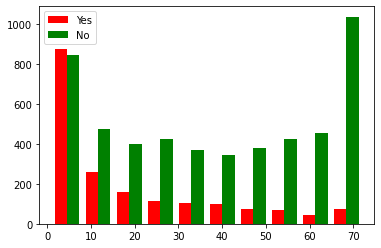

In [273]:
plt.hist([tenure_churn_yes,tenure_churn_no],color=['red','green'],label=['Yes','No'])
plt.legend()

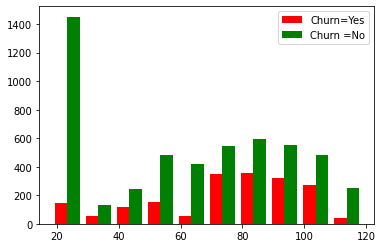

In [274]:
mc_churn_no = df1[df1['Churn'] == 'No'].MonthlyCharges
mc_churn_yes = df1[df1['Churn'] == 'Yes'].MonthlyCharges
plt.hist([mc_churn_yes,mc_churn_no],color=['red','green'],label=['Churn=Yes','Churn =No'])
plt.legend()

# ***Boxplot***

{'whiskers': [<matplotlib.lines.Line2D at 0x7f0e0956ec10>,
 'caps': [<matplotlib.lines.Line2D at 0x7f0e095716d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f0e0956e6d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f0e095781d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f0e09578710>],
 'means': []}

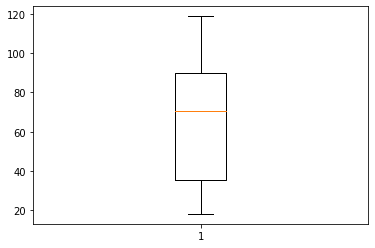

In [275]:
month_charge = df1['MonthlyCharges']
# total_charge = df['TotalCharges']
plt.boxplot(month_charge)

{'whiskers': [<matplotlib.lines.Line2D at 0x7f0e09557810>,
 'caps': [<matplotlib.lines.Line2D at 0x7f0e08c9e2d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f0e095572d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f0e08c9ed90>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f0e08ca6310>],
 'means': []}

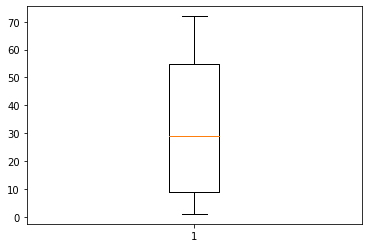

In [276]:
tenure = df1['tenure']
plt.boxplot(tenure)

# ***Histogram***

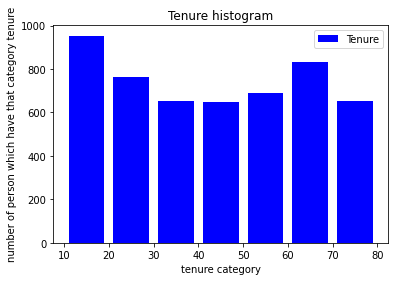

In [277]:
bins = [10,20,30,40,50,60,70,80]
plt.hist(tenure,bins,rwidth=0.8,color="b",label="Tenure")
plt.title("Tenure histogram")
plt.xlabel("tenure category")
plt.ylabel("number of person which have that category tenure")
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


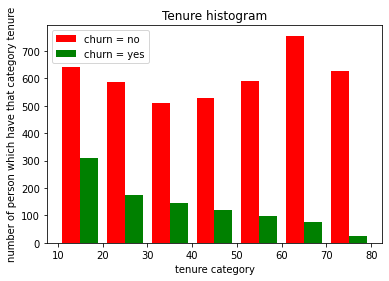

In [278]:
bins = [10,20,30,40,50,60,70,80]
plt.hist([tenure_churn_no,tenure_churn_yes],bins,rwidth=0.8,color=['r','g'],label=["churn = no",'churn = yes'])
plt.title("Tenure histogram")
plt.xlabel("tenure category")
plt.ylabel("number of person which have that category tenure")
plt.legend()
plt.show()

# **Scatter plot** 
scatter plot is used for numerci data to scatter

In [279]:
df1['InternetService'].value_counts()

Fiber optic    3096
DSL            2416
No             1520
Name: InternetService, dtype: int64

In [280]:
internet_service = ['Fiber optic','DSL','No']

Text(0, 0.5, 'MothlyCharges')

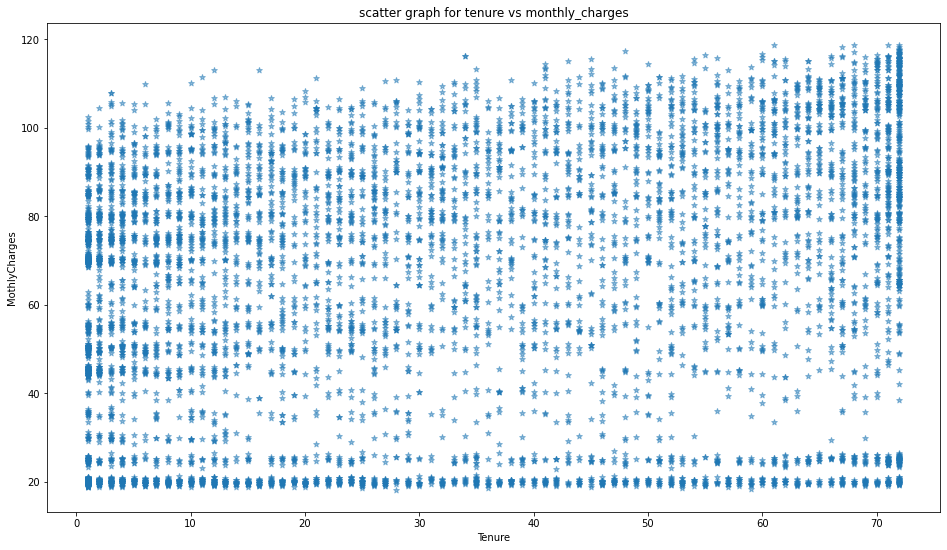

In [281]:

plt.figure(figsize=(16,9))
plt.scatter(tenure,month_charge,marker='*',alpha = 0.5,linewidths=None) #alpha is usef for transperancy 
plt.title("scatter graph for tenure vs monthly_charges")
plt.xlabel("Tenure")
plt.ylabel("MothlyCharges")

Text(0, 0.5, 'TotalCharges')

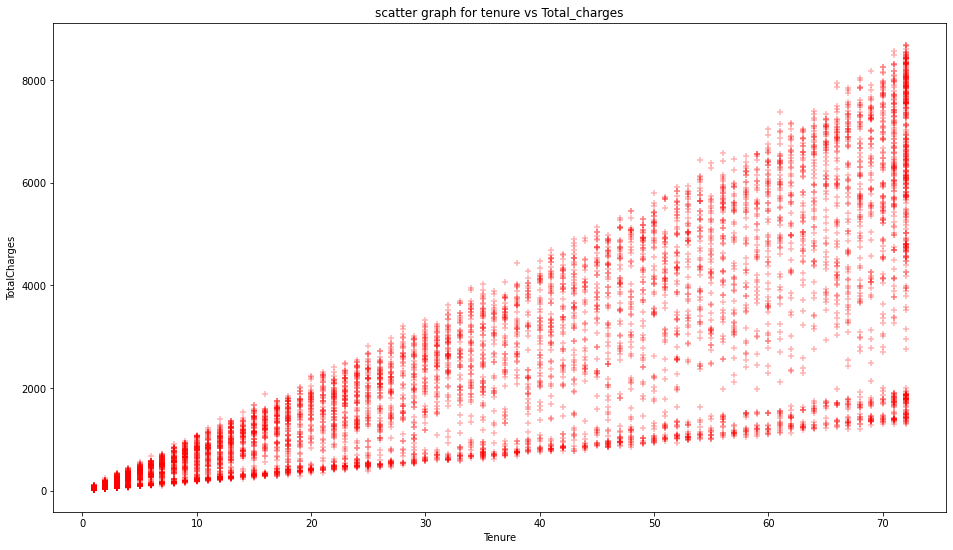

In [282]:
total_charge = df1['TotalCharges']
plt.figure(figsize=(16,9))
# plt.scatter(tenure,month_charge,c='g' ,marker='*',alpha = 0.5,linewidths=None) #alpha is usef for transperancy
plt.scatter(tenure,total_charge,c='r' ,marker='+',alpha = 0.3,linewidths=None) #alpha is usef for transperancy
plt.title("scatter graph for tenure vs Total_charges")
plt.xlabel("Tenure")
plt.ylabel("TotalCharges")

# ***Pie Chart***

In [283]:
internet_service_data = [3096,2421,1526] 

In [284]:
internet_service

['Fiber optic', 'DSL', 'No']

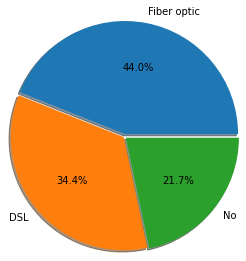

In [285]:
explode = [0.03,0.01,0.02]
plt.pie(internet_service_data, labels=internet_service,autopct="%0.1f%%",radius=1.3,shadow=True, explode=explode)
plt.show()

# **Seaborn Histogram/ Distplot**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


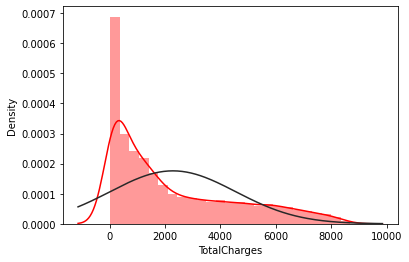

In [286]:
from scipy.stats import norm
churn_data = df1
sns.distplot(df1["TotalCharges"], fit = norm, color="r") #fit is used for normalization 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


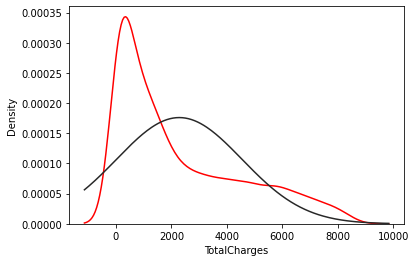

In [287]:
sns.distplot(df1["TotalCharges"], color="r",kde=True,hist = False, fit = norm) 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


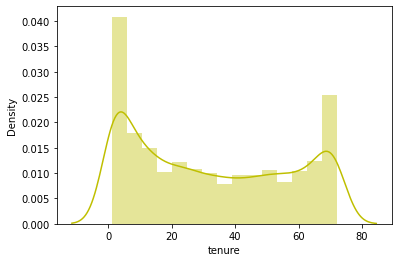

In [288]:
sns.distplot(df1["tenure"], color="y",kde=True,hist = True, norm_hist = True) 

# ***Seaborn Barplot***

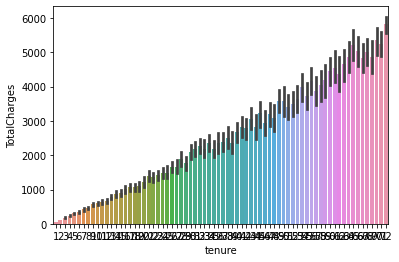

In [289]:
sns.barplot(x=df1.tenure, y= df1.TotalCharges)

# ***Question*** : *Which type of customers are more likely to churn* ?


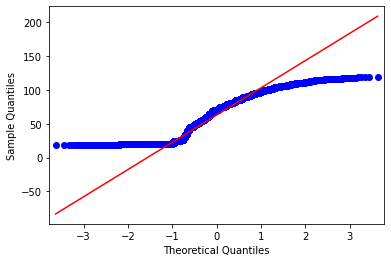

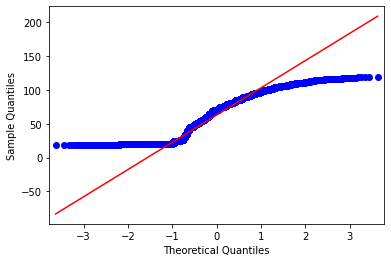

In [290]:
import statsmodels.api as sm
sm.qqplot(df1['MonthlyCharges'], line ="q")

In [291]:
# mean_data = df1['MonthlyCharges'].mean() 
# sd_data = df1['MonthlyCharges'].std()

In [292]:
#we need to standarize the data 
# for i in range(0,df1.shape[0],1):
#   df1['MonthlyCharges'].iloc[i] = (df1['MonthlyCharges'].iloc[i]-mean_data)/sd_data 

In [293]:
#now we need to find out quantiles/ percentile
# q = []
# j =0 
# for i in range(1,df1.shape[0]+1,1):
#   j = i/df1.shape[0] ;
#   q_temp = np.quantile(df1['MonthlyCharges'], j)
#   q.append(q_temp)

In [294]:
#Finally we need to sort the output and plot
# fig, ax = plt.subplots(figsize=(5, 5))
# plt.plot(q,sorted(df1['MonthlyCharges']))
# plt.xlabel("Quantile of standard normal distribution")
# plt.ylabel("Sample Z-score")
# plt.grid()

In [295]:
df1.sample(3)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1810,Female,0,Yes,Yes,71,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,No,No,One year,Yes,Credit card (automatic),95.15,6770.85,No
796,Male,0,No,No,31,Yes,Yes,Fiber optic,No,No,No,Yes,No,No,One year,No,Credit card (automatic),81.70,2548.65,No
395,Female,0,No,No,66,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,Yes,Two year,Yes,Credit card (automatic),90.05,5965.95,No


In [296]:
SC_yes = df1[df1.SeniorCitizen == 1]
SC_no = df1[df1.SeniorCitizen == 0]
SC_yes.shape

(1142, 20)

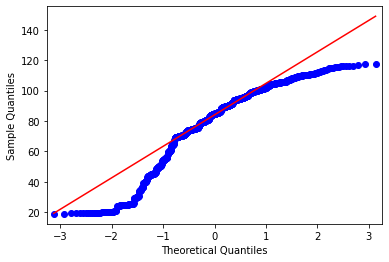

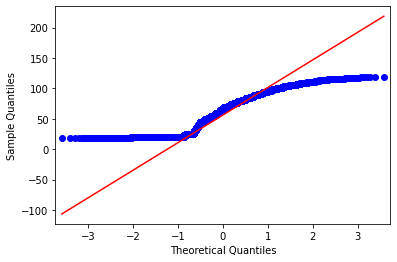

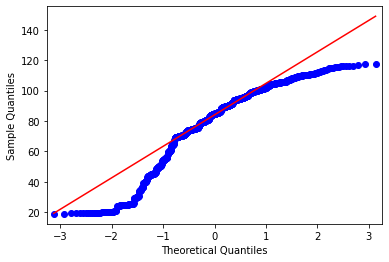

In [297]:
sm.qqplot(SC_no['MonthlyCharges'], line ="q")
sm.qqplot(SC_yes['MonthlyCharges'], line ="q")

In [298]:
# mean_data_sc_yes = SC_yes['MonthlyCharges'].mean() 
# sd_data_sc_yes = SC_yes['MonthlyCharges'].std()
# mean_data_sc_no = SC_no['MonthlyCharges'].mean() 
# sd_data_sc_no = SC_no['MonthlyCharges'].std()

# for i in range(0,SC_yes.shape[0],1):
#   SC_yes['MonthlyCharges'].iloc[i] = (SC_yes['MonthlyCharges'].iloc[i]-mean_data)/sd_data 

# for i in range(0,SC_no.shape[0],1):
#   SC_no['MonthlyCharges'].iloc[i] = (SC_no['MonthlyCharges'].iloc[i]-mean_data)/sd_data

# q_yes = []
# j_yes =0 
# for i_yes in range(1,SC_yes.shape[0]+1,1):
#   j_yes = i_yes/SC_yes.shape[0] ;
#   q_temp_yes = np.quantile(SC_yes['MonthlyCharges'], j_yes)
#   q_yes.append(q_temp_yes)

# q_no = []
# j_no =0 
# for i_no in range(1,SC_no.shape[0]+1,1):
#   j_no = i_no/SC_no.shape[0] ;
#   q_temp_no = np.quantile(SC_no['MonthlyCharges'], j_no)
#   q_no.append(q_temp_no)

# fig, ax = plt.subplots(figsize=(5, 5))
# plt.plot(q_yes,sorted(SC_yes['MonthlyCharges']))
# plt.xlabel("Quantile of standard normal distribution for Monthly charge who is Seneior Citizen")
# plt.ylabel("Sample Z-score")
# plt.grid()


# fig, ax = plt.subplots(figsize=(5, 5))
# plt.plot(q_no,sorted(SC_no['MonthlyCharges']))
# plt.xlabel("Quantile of standard normal distribution for Monthly charge who is not Seneior Citizen")
# plt.ylabel("Sample Z-score")
# plt.grid()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


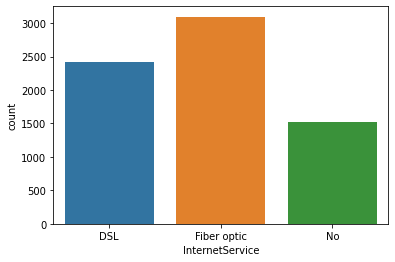

In [299]:
sns.countplot("InternetService", data=df1)

In [300]:
#to determine the target variable ( churn - yes or not) we need to chage them in binary 
df1.Churn.replace({'Yes':1,'No':0},inplace = True) 


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [301]:
# lets see churn rate based on gender, seniorcitizen...... 
print(df1[['gender','Churn']].groupby(['gender']).mean())
print(df1[['SeniorCitizen','Churn']].groupby(['SeniorCitizen']).mean())
print(df1[['Partner','Churn']].groupby(['Partner']).mean())
print(df1[['PhoneService','Churn']].groupby(['PhoneService']).mean())
#output from this -> gender wil not matter to decide churn , Phoneservice also 
#The churn rate of senior citizens is almost double that of young citizens.
#We do not expect gender to have significant predictive power because similar percentage of churn is shown both when a customer is a man or a woman.
# Customers with a partner churn less than customers with no partner.

           Churn
gender          
Female  0.269595
Male    0.262046
                  Churn
SeniorCitizen          
0              0.236503
1              0.416813
            Churn
Partner          
No       0.329761
Yes      0.197171
                 Churn
PhoneService          
No            0.250000
Yes           0.267475


In [302]:
df1[['InternetService','Churn']].groupby('InternetService').mean()
# by this we come to know that customers with fiber optic internet service are much likely to churn than other customers

,Churn
InternetService,
DSL,0.189983
Fiber optic,0.418928
No,0.074342


In [303]:
df1[['InternetService','MonthlyCharges']].groupby('InternetService').count()
# Fiber optic service is much more expensive than others which may be one of the reasons of customers churning.

,MonthlyCharges
InternetService,
DSL,2416
Fiber optic,3096
No,1520


In [304]:
df1[['StreamingTV','Churn']].groupby('StreamingTV').mean()
df1[['StreamingMovies','Churn']].groupby('StreamingMovies').mean()
df1[['OnlineSecurity','Churn']].groupby('OnlineSecurity').mean()

,Churn
OnlineSecurity,
No,0.313733
Yes,0.146402


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


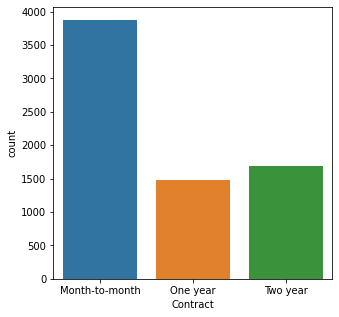

In [305]:
plt.figure(figsize=(5,5))
sns.countplot("Contract", data=df1)
#It seems like customers with short-term contract are more likely to churn. 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


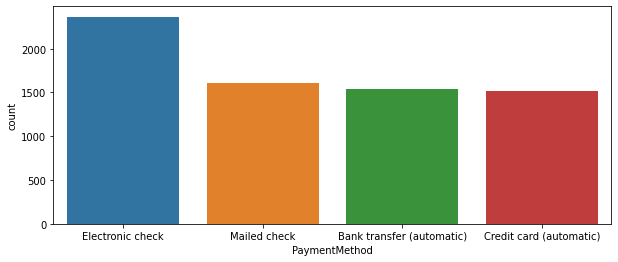

In [306]:
plt.figure(figsize=(10,4))
sns.countplot("PaymentMethod", data=df1)
# we get Customers who pay with electronic check are more likely to churn

In [307]:
# Overall : 
#gender wil not matter to decide churn , Phoneservice also 
#The churn rate of senior citizens is almost double that of young citizens.
#We do not expect gender to have significant predictive power because similar percentage of churn is shown both when a customer is a man or a woman.
# Customers with a partner churn less than customers with no partner.
#customers with fiber optic internet service are much likely to churn than other customers as Fiber optic service is much more expensive than others which may be one of the reasons of customers churning
#customers with short-term contract are more likely to churn.
#Customers who pay with electronic check are more likely to churn

# Chi-Square test 

In [308]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2
from scipy import stats

In [309]:
excluded_features = ['tenure', 'MonthlyCharges', 'TotalCharges']
cat_features = df1.drop(excluded_features , axis = 1)
features = pd.Series(cat_features.drop(['Churn'], axis=1).columns).append(pd.Series(['SeniorCitizen']))

In [310]:
# this function creates will automaticall generate the decision for the chi square test
def chi_square_test(data, feature):
    df = pd.crosstab(data[feature],data['Churn'])
    stat, p, dof, expected = chi2_contingency(df)
    print('='*60)
    print('Chi-Square Test for {}'.format(feature))
    print('='*60)
    print('degrees of freedom = %d' % dof)
    print('-'*60)
    # interpret test-statistic
    prob = 0.95
    critical = chi2.ppf(prob, dof)
    print('Results:')
    print(' ')
    print('probability = %.3f, critical = %.3f, stat = %.3f' % (prob, critical, stat))
    print('-'*60)
    print('Decision based on Chi-Square Statistics:')
    print(' ')
    if abs(stat) >= critical:
        print('The Churns are dependent on {} : (reject H0)'.format(feature))
    else:
        print('The Churns are independent on {} : (fail to reject H0)'.format(feature))
    # interpret p-value
    alpha = 1.0 - prob
    print('-'*60)
    print('Decision based on p-value:')
    print(' ')
    print('alpha = %.2f, p = %.3f' % (alpha, p))
    if p <= alpha:
        print('The Churns are dependent on {} : (reject H0)'.format(feature))
    else:
        print('The Churns are independent on {} : (fail to reject H0)'.format(feature))
    print('_'*60)
    print(' '*60)
    print('_'*60)
    print('_'*60)

In [311]:
for feature in features:
    chi_square_test(df1, feature)

Chi-Square Test for gender
degrees of freedom = 1
------------------------------------------------------------
Results:
 
probability = 0.950, critical = 3.841, stat = 0.475
------------------------------------------------------------
Decision based on Chi-Square Statistics:
 
The Churns are independent on gender : (fail to reject H0)
------------------------------------------------------------
Decision based on p-value:
 
alpha = 0.05, p = 0.490
The Churns are independent on gender : (fail to reject H0)
____________________________________________________________
                                                            
____________________________________________________________
____________________________________________________________
Chi-Square Test for SeniorCitizen
degrees of freedom = 1
------------------------------------------------------------
Results:
 
probability = 0.950, critical = 3.841, stat = 158.441
------------------------------------------------------------
De

# PCA (Priciple Component Analysis ) 

In [312]:
df1.columns  # total number of features == 20 

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [313]:
num_var = df1.select_dtypes(include = ['int64','float64']).columns
num_var

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges', 'Churn'], dtype='object')

In [314]:
df2_pca = df1.drop(columns=['gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
        'Churn'] )

In [315]:
df2_pca.head(3)

,tenure,MonthlyCharges,TotalCharges
0,1,29.85,29.85
1,34,56.95,1889.50
2,2,53.85,108.15


In [316]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df2_pca)

StandardScaler()

In [317]:
scaled_data = scaler.transform(df2_pca)
scaled_data

array([[-1.28024804, -1.16169394, -0.99419409],
       [ 0.06430269, -0.26087792, -0.17373982],
       [-1.23950408, -0.36392329, -0.95964911],
       ...,
       [-0.87280842, -1.17000405, -0.85451414],
       [-1.15801615,  0.31916782, -0.87209546],
       [ 1.36810945,  1.35793167,  2.01234407]])

In [318]:
from sklearn.decomposition import PCA
pca = PCA(n_components= 2)
pca.fit(scaled_data)

PCA(n_components=2)

In [319]:
x_pca = pca.transform(scaled_data)

In [320]:
scaled_data.shape

(7032, 3)

In [321]:
x_pca.shape

(7032, 2)

In [322]:
x_pca

array([[-1.95165689,  0.08275258],
       [-0.20579255,  0.23514165],
       [-1.51808264, -0.52254219],
       ...,
       [-1.63168822,  0.34516629],
       [-1.08184347, -1.00900265],
       [ 2.77397648, -0.12278947]])

In [323]:
target  = df1['Churn']

Text(0, 0.5, 'second component')

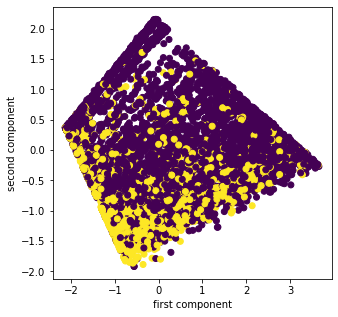

In [324]:
plt.figure(figsize=(5,5))
plt.scatter(x_pca[:,0],x_pca[:,1],c= target) # c = target has been used to plot components based on churn means target data -- here 0 has been shown by yellow and 1 has been shown by violet 
plt.xlabel("first component")
plt.ylabel("second component")